<a href="https://colab.research.google.com/github/carlosalbertocorimayo/Procesamiento_Digital_Imagenes/blob/main/TrabajoIntegrador/Integrador_PDI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

***Ejercicios de Procesamiento Digital de Imágenes***

*Alumno: Carlos Corimayo*


# **Set Up**

In [23]:
# Montamos el Drive en donde se alojará la imagén seleccionada
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [24]:
# Nos posicionamos en la ruta del Drive donde se alojará la imagén
%cd /content/drive/MyDrive/Procesamiento_Digital_Imagenes

/content/drive/MyDrive/Procesamiento_Digital_Imagenes


In [25]:
# Se importa las bibliotecas y funciones necesarias

import cv2 # Importa la biblioteca OpenCV: la usaremos para leer imágenes, aplicar filtros, detectar bordes.

from google.colab.patches import cv2_imshow # Esta función se utiliza en Google Colab para mostrar imágenes utilizando OpenCV.

import matplotlib.pyplot as plt # Importamos el módulo pyplot para mostrar imágenes

import matplotlib.image as mpimg # Importa el submódulo image de matplotlib: se usa principalmente para leer (imread) y escribir (imsave) imágenes

import numpy as np # Necesitamos esta librería ya que las imágenes se representan como arreglos de NumPy.

from PIL import Image # Importa la clase Image del módulo PIL (pillow) lo que permite abrir, guardar, crear o convertir imágenes de una forma más general que OpenCV.

In [9]:
# Con el siguiente comando descargamos la imagen desde la URL proporcionada
!wget https://i.postimg.cc/fRmJJFC4/houses-hp.jpg -q

# **Ejercicio 1**

## **Inciso A**

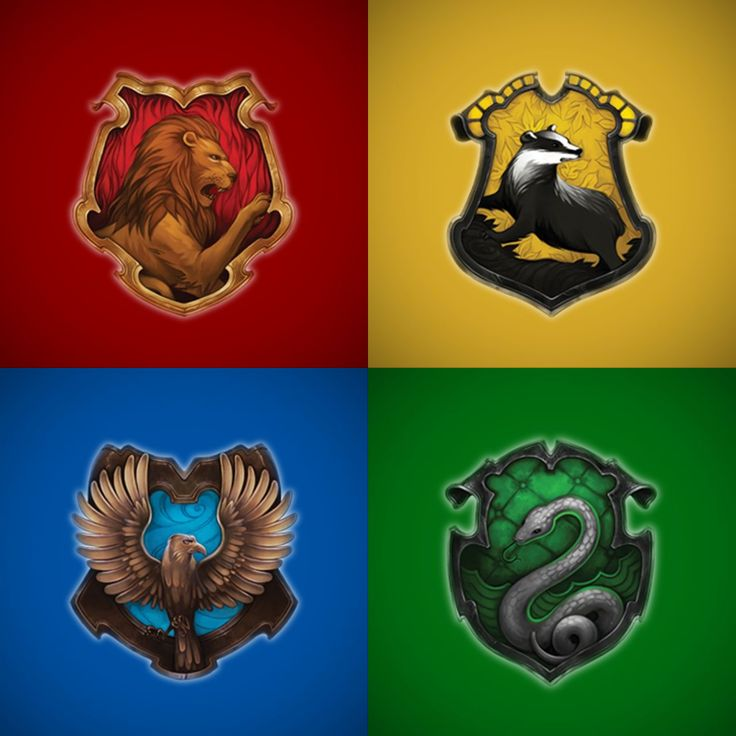

Dimensiones de la imagen: (736, 736, 3)
Tipo de datos: uint8
Tamaño en memoria (bytes): 1625088


In [26]:
# Carga de imagen e información de los canales BGR

imagen_bgr = cv2.imread('houses-hp.jpg') # Carga de imagen en formato BGR ya que usamos OpenCV
cv2_imshow(imagen_bgr) # Mostramos imagen

print("Dimensiones de la imagen:", imagen_bgr.shape)
print("Tipo de datos:", imagen_bgr.dtype)
print("Tamaño en memoria (bytes):", imagen_bgr.nbytes)

Podemos entonces observar, que la imagen con la que estamos trabajando tiene las siguientes caracteristicas:
* **736 pixeles de alto, por 736 pixeles de ancho y 3 canales de color**.
* **uint8** como tipo de dato significa que cada valor de pixel está representado como un entero de 8 bits. Estos valores pueden ir desde 0 a 255, lo que se relaciona con la intensidad de colores que se tendrá en cada canal.


Estadísticas del canal Azul:

Valor mínimo: 0, Valor máximo: 255, Promedio: 51.11 



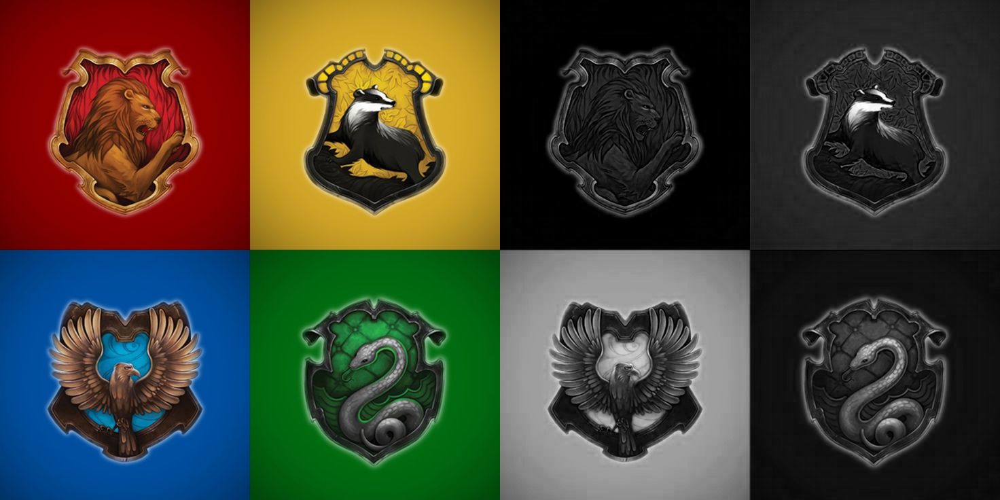

In [13]:
# Canal Azul (B) - Canal "0"

# Extraer canal azul:
B = imagen_bgr[:,:,0] # Considerando que la imagen es una matriz de 3 dimensiones, vamos a tomar todas las filas, todas las columnas y trabajar unicamente con el canal 0 (Azul)

# Estadísticas del canal azul:
print("Estadísticas del canal Azul:\n")
print(f"Valor mínimo: {B.min()}, Valor máximo: {B.max()}, Promedio: {B.mean():.2f} \n")

# Convertir canal B a 3 canales para poder unirlo con imagen_bgr (Toma una imagen de 1 solo canal y la convierte en una imagen de 3 canales, duplicando ese canal en las tres posiciones, crea una imagen "falsa")
B_color = cv2.merge([B, B, B])

# Unimos ambas imagenes (en OpenCV no podemos unir imagenes con diferente numeros de canales, por eso ejectuamos el paso previo)
combinada = cv2.hconcat([imagen_bgr, B_color])

# Mostrar ambas imagenes
cv2_imshow(combinada)

*Intepretación de las estadísticas del canal **Azul**:*

1. Valor mínimo: 0: hay píxeles en la imagen que no tienen
componente azul.
2. Valor máximo: 255: hay píxeles en la imagen con la máxima intensidad de azul.
3. Promedio: 51.11 : promedio de la intensidad del canal azul en toda la imagen.

Estadísticas del canal Verde:

Valor mínimo: 0, Valor máximo: 255, Promedio: 81.04 



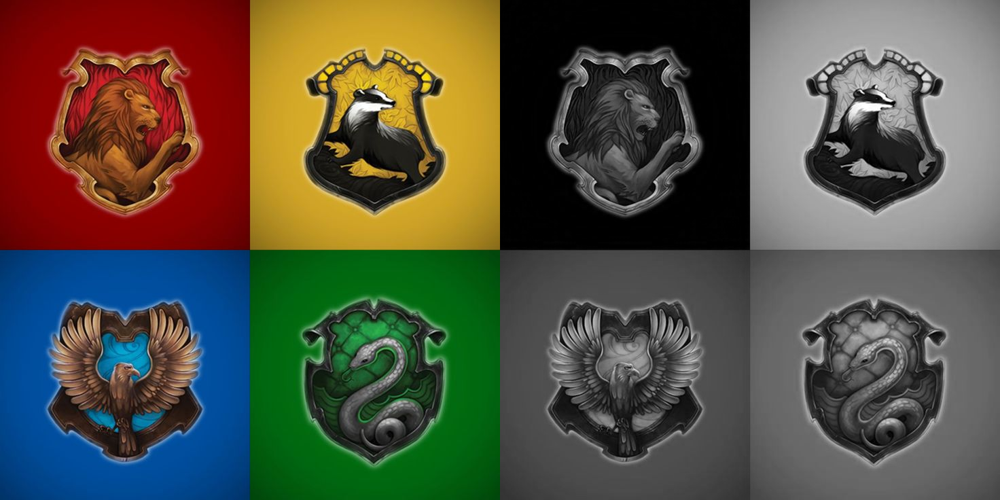

In [14]:
# Canal Verde (G) - Canal "1"

# Extraer canal Verde:
G = imagen_bgr[:,:,1]

# Estadísticas del canal verde:
print("Estadísticas del canal Verde:\n")
print(f"Valor mínimo: {G.min()}, Valor máximo: {G.max()}, Promedio: {G.mean():.2f} \n")

# Convertir el canal verde a una imagen de 3 canales
G_color = cv2.merge([G, G, G])

# Unir la imagen original con el canal verde "convertido"
combinada = cv2.hconcat([imagen_bgr, G_color])

# Mostrar ambas imágenes lado a lado
cv2_imshow(combinada)

Podemos observar que el cuadrante de Hufflepuff (dorado) presenta tonos más claros en la escala de grises.

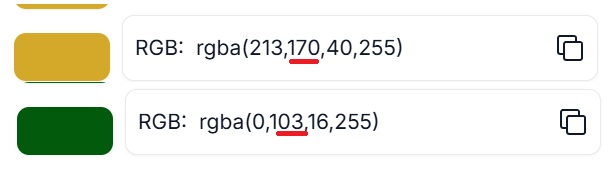

In [21]:
!wget https://i.postimg.cc/Y96FGpVq/Amarillo-Verde.jpg -q
amarillo_verde = cv2.imread('Amarillo-Verde.jpg')
cv2_imshow(amarillo_verde)

Esto se debe a que, en formato RGB, el valor del canal verde (G) en la imagen dorada es aproximadamente 170, mientras que en la imagen verde es de alrededor de 103.
Como la conversión a escala de grises toma en cuenta todos los canales, un valor más alto en G contribuye a un tono más claro en la imagen resultante.

Estadísticas del canal Rojo:

Valor mínimo: 0, Valor máximo: 255, Promedio: 85.90 



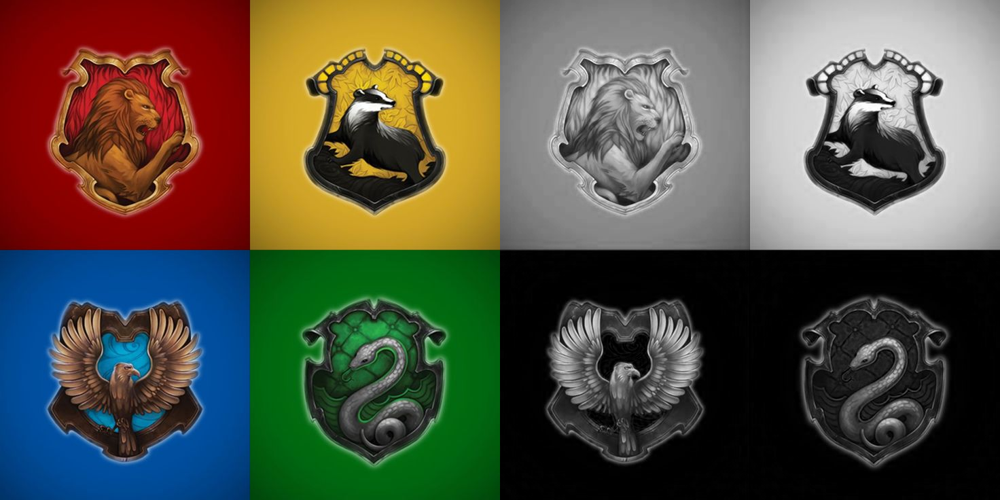

In [15]:
# Canal Rojo (R) - Canal "2"

# Extraer canal rojo:
R = imagen_bgr[:,:,2]

# Estadísticas del canal rojo:
print("Estadísticas del canal Rojo:\n")
print(f"Valor mínimo: {R.min()}, Valor máximo: {R.max()}, Promedio: {R.mean():.2f} \n")

# Convertir el canal rojo a imagen de 3 canales (escala de grises simulada en color)
R_color = cv2.merge([R, R, R])

# Unir imagen original con canal rojo
combinada = cv2.hconcat([imagen_bgr, R_color])

# Mostrar ambas imágenes
cv2_imshow(combinada)

Algo similar a lo observado en el canal verde ocurre al comparar los cuadrantes rojo y dorado:

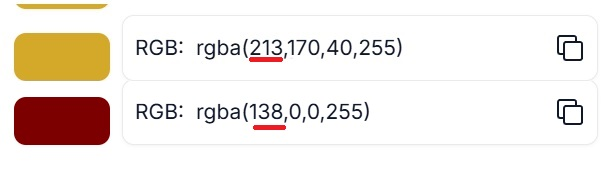

In [22]:
!wget https://i.postimg.cc/T1YYQGk9/Amarillo-Rojo.jpg -q
amarillo_rojo = cv2.imread('Amarillo-Rojo.jpg')
cv2_imshow(amarillo_rojo)

El valor del canal rojo (R) en el cuadrante dorado es aproximadamente 213, mientras que en el cuadrante rojo es de 138.
Esto explica por qué el dorado se ve más claro en escala de grises: tiene un valor más alto en el canal R, que también aporta significativamente al brillo en la conversión a grises.

## **Inciso B**

Resumen de las estadísticas calculadas en los tres canales:

1. Estadísticas del canal Azul:

  *Valor mínimo: 0, Valor máximo: 255, Promedio: 51.11*

2. Estadísticas del canal Verde:

  *Valor mínimo: 0, Valor máximo: 255, Promedio: 81.04*

3. Estadísticas del canal Rojo:

  *Valor mínimo: 0, Valor máximo: 255, Promedio: 85.90*

Teniendo en cuenta los resultados anteriores, se puede decir que, el canal rojo tiene el promedio más alto, seguido por el verde y finalmente por el canal azul.

La mayor presencia relativa del canal rojo y verde puede llegar a explicarse debido a la presencia del color amarillo (dorado) en la imagen, ya que, en el espacio de color BGR, el amarillo (dorado) se obtiene combinando componentes de rojo y verde con alta intensidad.

Además, se puede observar también que, cuando analizamos las imagenes del **canal rojo** y el **canal verde**, la zona de Hufflepuff (amarilla/dorada) resulta más clara que la zona de Gryffindor (rojo/bordo) y la de Slytherin (verde) respectivamente.

Esto puede deberse a que tanto el rojo como el verde que observamos en las respectivas imagenes no son colores "puros" sino son versiones más "oscuras". Teniendo esto en cuenta, se podría entender que las zonas doradas/amarillas sean más claras en las imagenes analizadas tomando como ejemplo los siguientes valores en el canal GBR:

*  Bordó (32, 0, 128) - En el canal Azul tiene un valor bajo (32), es decir el color no brilla en el canal azul. En el canal Verde tiene valor muy bajo (0), es decir, no tiene componente verde. Finalmente el Canal Rojo tiene valor moderado/alto (128), por lo tanto es el canal dominante, pero no está al máximo.

*  Verde oscuro (50, 100, 0) - En el canal Azul tiene un valor medio (50), lo que aporta un leve tinte azulado al color. En el canal Verde tiene un valor moderado (100), es la componente principal del color, pero no lo suficiente como para que sea un verde brillante. Finalmente en el canal Rojo tiene un valor muy bajo (0), por lo tanto, no aporta al color final.

* Dorado/Amarillo (0, 255, 255) - En el canal Azul tiene un valor muy bajo (0), es decir, no tiene componente azul. En el canal Verde tiene un valor máximo (255), por lo tanto, brilla con intensidad en el canal verde. Finalmente, en el canal Rojo también tiene un valor máximo (255), lo que hace que este color se vea muy brillante también en el canal rojo.




También podemos entender el valor promedio más alto en los canales verde y rojo haciendo uso de los histogramas de intensidad por canal

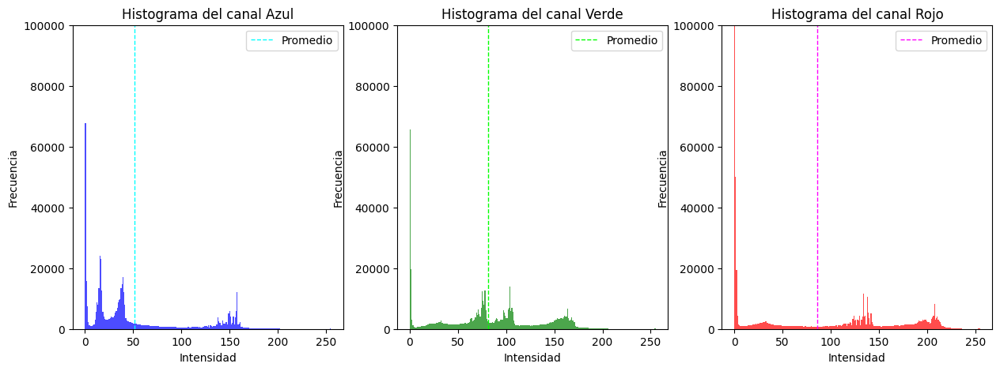

In [ ]:
# Separar los canales BGR
B, G, R = cv2.split(imagen_bgr)

# Calcular el valor promedio de intensidad para cada canal
avg_B = np.mean(B)
avg_G = np.mean(G)
avg_R = np.mean(R)

# Crear histogramas para cada canal
plt.figure(figsize=(15, 5))

# Histograma del canal Azul
plt.subplot(1, 3, 1)  # Se prepara el primer subplot (1 fila, 3 columnas, posición 1) donde irá el histograma del canal azul.
plt.hist(B.ravel(), bins=256, color='blue', alpha=0.7)
plt.axvline(avg_B, color='cyan', linestyle='dashed', linewidth=1)
plt.title('Histograma del canal Azul')
plt.xlabel('Intensidad')
plt.ylabel('Frecuencia')
plt.legend(['Promedio'])
plt.ylim(0, 100000)

# Histograma del canal Verde
plt.subplot(1, 3, 2)
plt.hist(G.ravel(), bins=256, color='green', alpha=0.7)
plt.axvline(avg_G, color='lime', linestyle='dashed', linewidth=1)
plt.title('Histograma del canal Verde')
plt.xlabel('Intensidad')
plt.ylabel('Frecuencia')
plt.legend(['Promedio'])
plt.ylim(0, 100000)

# Histograma del canal Rojo
plt.subplot(1, 3, 3)
plt.hist(R.ravel(), bins=256, color='red', alpha=0.7)
plt.axvline(avg_R, color='magenta', linestyle='dashed', linewidth=1)
plt.title('Histograma del canal Rojo')
plt.xlabel('Intensidad')
plt.ylabel('Frecuencia')
plt.legend(['Promedio'])
plt.ylim(0, 100000)

# Mostrar los histogramas
plt.show()


En el histograma del canal azul podemos ver que, para valores de intensidad bajo (cercanos a 0), la cantidad de pixeles (frecuencia) es relativamente más alta que en los otros dos canales. Esto explicaría el valor promedio más bajo para este canal.
Por otro lado, en el histograma del canal rojo, podemos ver que, para valores de intensidad alto (cercanos a 255), la cantidad de pixeles es relativamente mas alta que en los canales azul y verde.

Nuevamente se puede señalar que el amarillo (dorado) es una combinación de rojo y verde en el espacio de color BGR. Por lo tanto, la presencia de ese color en la imagen afecta los canales rojo y verde,
aumentando sus valores promedio y la frecuencia de píxeles con alta intensidad en estos canales.

## **Inciso C**

Visualización de los Canales RGB

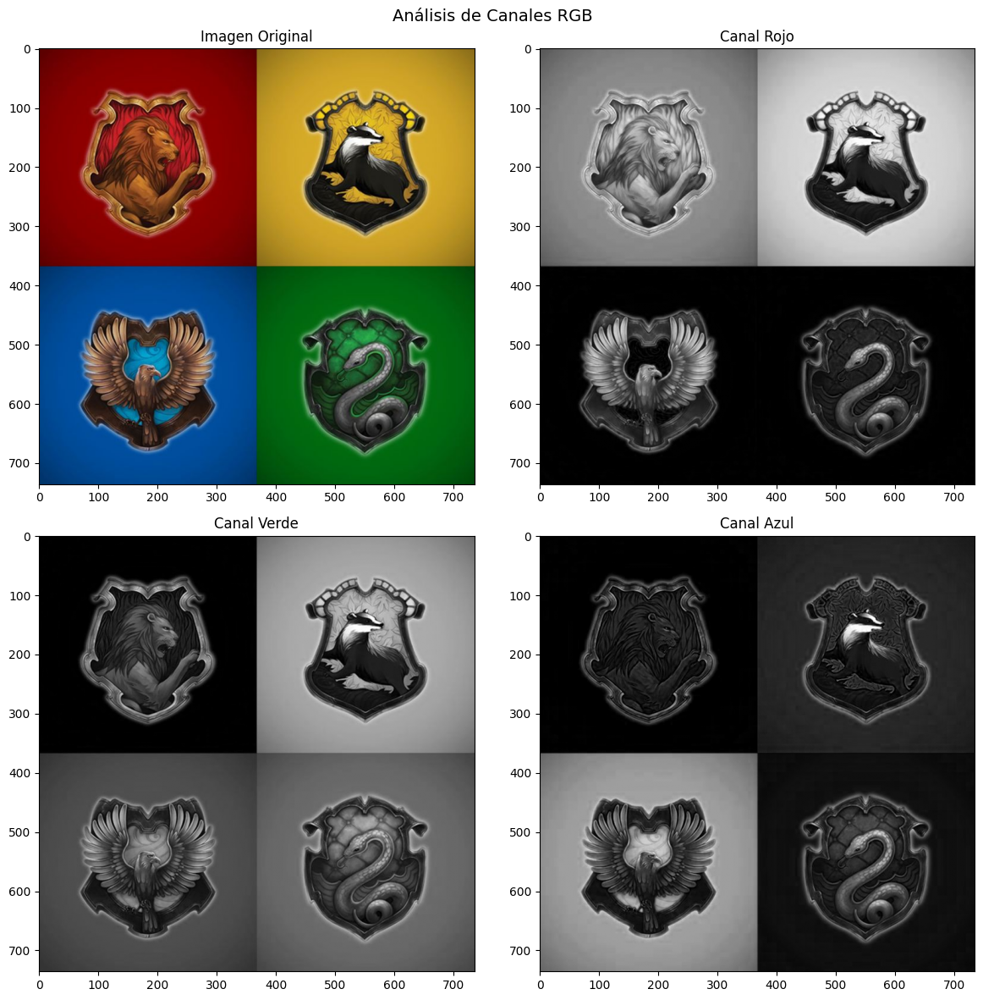

In [ ]:
# Cargar imagen RGB

imagen_rgb = plt.imread('houses-hp.jpg') # Al usar matpotlib, la imagen se leerá en formato RGB

# Configuración de subplots
fig, axes = plt.subplots(2, 2, figsize=(12,12))
fig.suptitle('Análisis de Canales RGB', fontsize=14)

# Imagen Original
axes[0,0].imshow(imagen_rgb)
axes[0,0].set_title('Imagen Original')

# Canal Rojo
axes[0,1].imshow(imagen_rgb[:,:,0], cmap='gray') # "cmap = gray" fuerza a mostrarlo en escala de grises, no en color.
axes[0,1].set_title('Canal Rojo')

# Canal Verde
axes[1,0].imshow(imagen_rgb[:,:,1], cmap='gray')
axes[1,0].set_title('Canal Verde')

# Canal Azul
axes[1,1].imshow(imagen_rgb[:,:,2], cmap='gray')
axes[1,1].set_title('Canal Azul')

plt.tight_layout()
plt.show()

Para cada una de las imagenes, se extrae y muestra el canal correspondiente como imagen en escala de grises.

Por ejemplo, para el canal rojo, las zonas claras representan alta intensidad de dicho color, y las oscuras, poca intensidad del mismo. La principal diferencia con el espacio BGR es que, en RGB el primer canal es Rojo y el tercero es Azul.

Conversión Canal BGR a RGB

In [ ]:
# Carga de Imagenes RGB Sin Conversion
imagen_rgb = plt.imread('houses-hp.jpg')

# Primero cargamos la imagen en formato BGR
imagen_bgr_original = cv2.imread('houses-hp.jpg')

# cv2.cvtColor() cambia el formato de color de la imagen de BGR a RGB
imagen_rgb_convertida = cv2.cvtColor(imagen_bgr_original, cv2.COLOR_BGR2RGB)

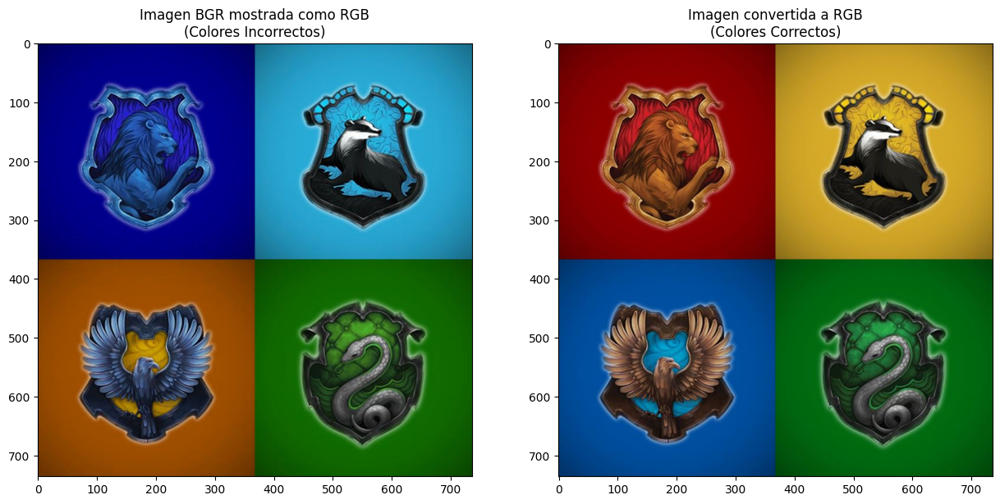

In [ ]:
# Visualización comparativa
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,7))

ax1.imshow(imagen_bgr_original)
ax1.set_title('Imagen BGR mostrada como RGB\n(Colores Incorrectos)')

ax2.imshow(imagen_rgb_convertida)
ax2.set_title('Imagen convertida a RGB\n(Colores Correctos)')

plt.show()

Lo primero que debemos tener en cuenta es que OpenCV es una biblioteca pensada para el procesamiento de imágenes y visión por computadora y el formato de imágenes que manejas es BGR por defecto. Por otro lado, Matplotlib es una biblioteca de visualización de datos que incluye funcionalidades para mostrar imágenes, y espera que las imágenes estén en el formato RGB.

Los colores se ven diferentes porque al intentar mostrar una imagen en formato BGR usando Matplotlib sin ningún tipo de conversión, los colores se verán "invertidos" porque Matplotlib interpretará el primer canal (que es azul en BGR) como rojo, el segundo (verde) se mantendrá como verde, y el tercero (rojo) como azul.

Como podemos observar, todos los colores de los escudos de las casas de Hogwarts se invierten menos el verde (Slytherin) que se mantiene igual porque el canal verde se encuentra en la misma posición en ambos formatos (tanto en BGR como en RGB).

Por otra parte, como se mencionó previamente, en el escudo de HufflePuff predonomina el dorado/amarillo. En el espacio BGR este color se obtiene mediante una combinación "baja" en azul, "media" en verde y "alta" en rojo. Pero en el espacio RGB sin conversión, al existir inversión de colores, la combinación ahora será alta en azul, media en verde (se mantiene) y bajo en rojo, dando como resultado ese color "turquesa" que podemos ver en la imagen.

# **Ejercicio 2**

## **Inciso A y B**

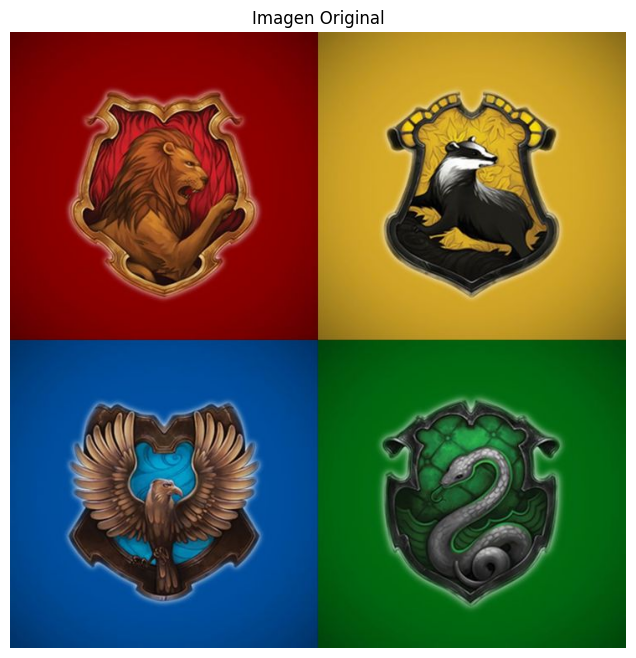

Tamaño original: 736 x 736


In [ ]:
# Mostrar imagen original
plt.figure(figsize=(8,8))
plt.imshow(imagen_rgb)
plt.title("Imagen Original")
plt.axis('off')
plt.show()

# Tamaño original
alto, ancho = imagen_rgb.shape[:2]
print(f"Tamaño original: {ancho} x {alto}")

**Muestreo Espacial (Reducción de la cantidad de píxeles)**

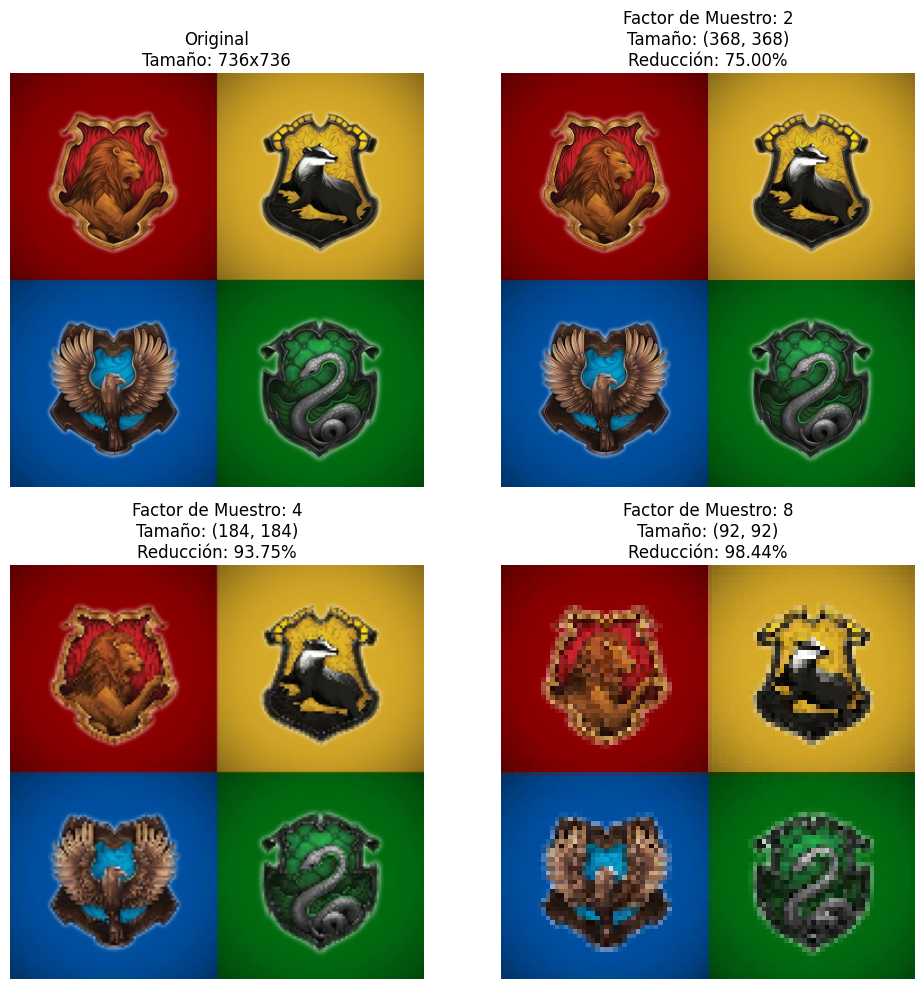

In [ ]:
factores = [2, 4, 8] # Crea una lista con los factores de muestreo: vamos a reducir la imagen tomando 1 de cada 2, 4 u 8 píxeles.
muestreadas = {}
info_textos = []

#Tamaño Original
alto, ancho = imagen_rgb.shape[:2] # Se extraen el alto y ancho de la imagen original, para poder calcular luego cuánto se reduce.

# Crear versiones muestreadas y guardar información

for f in factores: # Inicia un bucle para procesar los factores 2, 4 y 8.
    reducida = imagen_rgb[::f, ::f] # Se toma 1 píxel cada f posiciones, tanto en filas como columnas. Ejemplo: si f = 4, se toma 1 de cada 4 píxeles (magen 4 veces más pequeña en cada eje.)
    muestreadas[f] = reducida # Guarda esa imagen reducida en el diccionario

    nuevo_tam = reducida.shape[:2] # Obtiene el nuevo tamaño (alto y ancho) de la imagen reducida.
    reduccion = 100 * (1 - (nuevo_tam[0] * nuevo_tam[1]) / (alto * ancho)) # Calcula el porcentaje de reducción en la cantidad de píxeles.
    texto = f"Factor de Muestro: {f}\nTamaño: {nuevo_tam[::-1]}\nReducción: {reduccion:.2f}%"
    info_textos.append(texto)

# Mostrar Imágenes
fig, axs = plt.subplots(2, 2, figsize=(10, 10)) # Crea una figura con una grilla de 2x2 subplots para mostrar las imágenes.

# Imagen original
axs[0, 0].imshow(imagen_rgb) # Muestra la imagen original en la posición superior izquierda y le pone un título con su tamaño.
axs[0, 0].set_title(f"Original\nTamaño: {ancho}x{alto}")
axs[0, 0].axis('off')

# Mostrar muestreadas con texto informativo
for i, f in enumerate(factores): # Empieza un bucle para mostrar las imágenes muestreadas.
    row = (i + 1) // 2 # Calcula dónde ubicar cada imagen muestreada
    col = (i + 1) % 2
    axs[row, col].imshow(muestreadas[f])
    axs[row, col].set_title(info_textos[i])
    axs[row, col].axis('off')

plt.tight_layout()
plt.show()


Lo primero que podemos observar es que a mayor factor de muestreo, menor resolución y mayor pérdida de información:
* Con factor 2, la imagen aún conserva buena calidad a simple vista.
* Con factor 8, se vuelve notoriamente borrosa y los detalles se pierden.
* Con factor 16, la imagen está muy pixeleada y tuvo una perdida considerable de calidad .

## **Inciso C**

**Cuantización (Reducción de la cantidad de niveles de intensidad)**

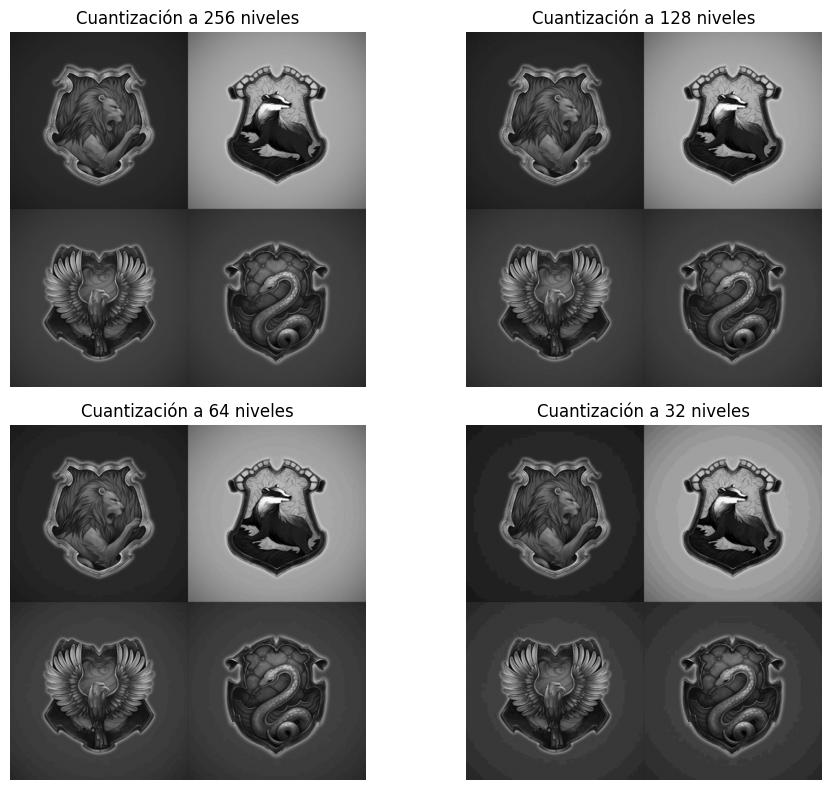

In [ ]:
# Cargar imagen con PIL y convertir a escala de grises
image = Image.open('houses-hp.jpg') # Abre la imagen con la librería PIL
gray_image = image.convert("L") # Convierte la imagen en escala de grises (en realidad, convierte la imagen al modo "L" - luminicencia.)

# Convertir imagen en array
gray_array = np.array(gray_image) # Convierte la imagen PIL a un array de NumPy para poder trabajar con los valores numéricos de los píxeles.

# Definir niveles de cuantización (orden descendente)
niveles = [256, 128, 64, 32] # Lista con los niveles de cuantización que vamos a aplicar. 256 = sin cuantizar (original), 128 = reducción a la mitad, etc.

# Función de cuantización
def quantize_image(img_array, niveles): # Define una función que toma un array de imagen y reduce su cantidad de niveles. Aplicar cuantización a la imagen en escala de grises usando distintos niveles.
    step = 256 // niveles # Saltos entre niveles. ejemplo, para cuantizar a 4 niveles → step = 64. Entonces los valores posibles serían: 0, 64, 128, 192
    quantized = (img_array // step) * step
    return quantized.astype(np.uint8)

# Crear figura con subplots 2x2
fig, axes = plt.subplots(2, 2, figsize=(10, 8))

# Iterar sobre niveles y ejes
for ax, niveles in zip(axes.flat, niveles): # Recorre los subplots y los niveles al mismo tiempo (zip).
    quantized_array = quantize_image(gray_array, niveles) #Aplica la cuantización a la imagen con el nivel correspondiente.
    ax.imshow(quantized_array, cmap='gray', vmin=0, vmax=255)
    ax.set_title(f'Cuantización a {niveles} niveles')
    ax.axis('off')

plt.tight_layout()
plt.show()

**PIL** Es necesaria ya que, por una parte, se utilizará una imagen que no está en escalas de grises y además se usará una fórmula ponderada para la conversión de RGB a escala de grises basada en la percepción humana.
Una imagen en color RGB tiene 3 canales (rojo, verde, azul). Al convertirla a "L", la imagen:
* Pierde la información de color.
* Se queda solo con la intensidad de luz de cada píxel.
* La formúla que se utliza para la conversión es: **gray = 0.299 x R + 0.587 x G + 0.114 x B**

## **Inciso D**

La cuantización a **256 niveles** representa la imagen original en escala de grises sin pérdida de información, por lo tanto *no hay degradación*. Para **128 niveles** a simple vista, *casi no hay pérdida, la calidad sigue siendo muy buena, las transiciones son suaves,y aún se conservan detalles*. Para **64 niveles** se comienza a notar *ligeramente una pérdida de suavidad, especialmente alrededor de los escudos*. Finalmente, para **32 niveles** la degradación es claramente visible. Se nota una *clara perdida de suavidad alrededor de los escudos*.

*En todos los casos, no parece haberse producido una visible pérdida de suavidad en el interior de los escudos*.

# **Ejercicio 3**

Seguiré utilizando la misma imagen del principio, la cual se muestra a continuación:

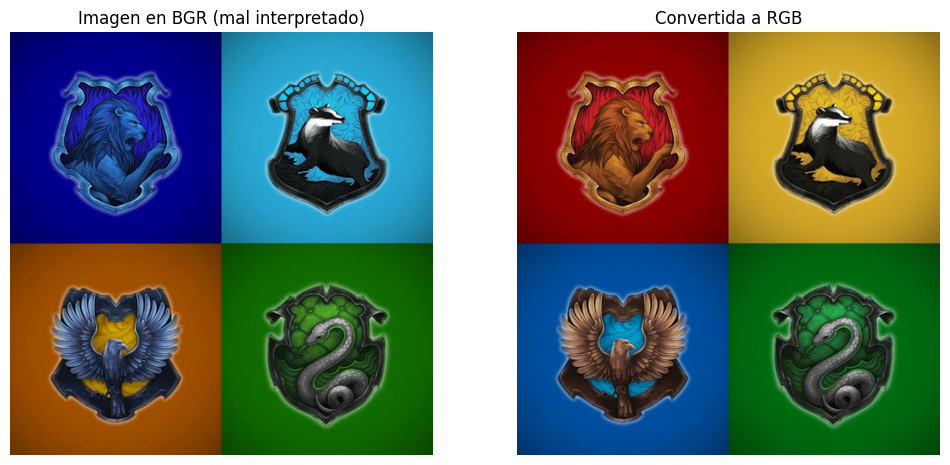

In [27]:
# Cargar imagen en formato BGR
img_cv = imread('houses-hp.jpg')

# Convertir a RGB
img_rgb = img_cv[:, :, [2, 1, 0]]  # BGR → RGB

# Mostrar lado a lado
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Imagen original (BGR mal interpretada como RGB)
axs[0].imshow(img_cv)
axs[0].set_title("Imagen en BGR (mal interpretado)")
axs[0].axis('off')

# Imagen correcta en RGB
axs[1].imshow(img_rgb)
axs[1].set_title("Convertida a RGB")
axs[1].axis('off')

plt.show()

## **Inciso A**

Para segmentar los colores vamos a utilizar los los umbrales elegidos luego de analizar los resultados obtenidos en la siguiente herramienta: https://imagecolorpicker.com/.

Como criterio general podriamos basarnos en las siguientes "reglas":
* Rojo: necesitamos valores medios-altos para el canal R, y bajos para los canales G, B.
* Azul: necesitamos valores medios-altos para el canal B, y bajos para los canales R, B
* Verde: necesitamos valores medios (pero con un umbral inferior menor a los usados en Rojo y Azul) para el canal G , y bajos para los canales R, B.

Las segmentaciones se harán de modo tal que podamos obtener los escudos, de la mejor forma posible, de cada una de las casa de Hogwarts.

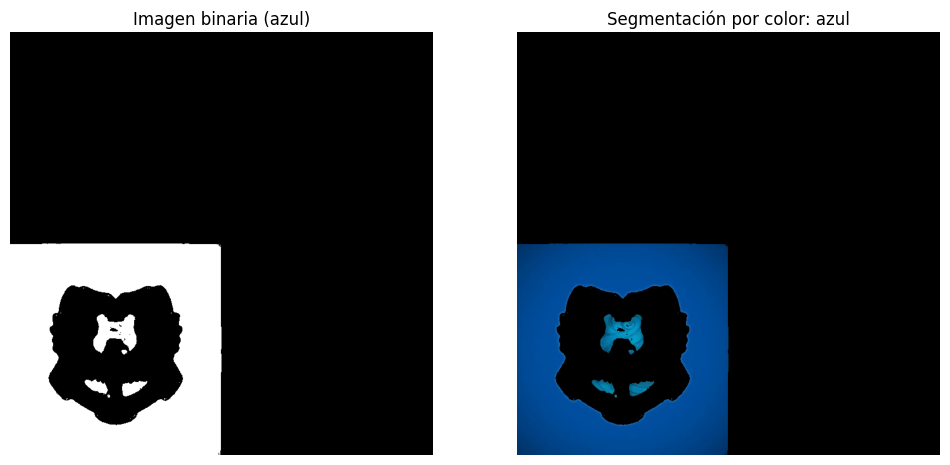

In [32]:
# El siguiente código segmenta una imagen por color. Es decir, extrae las zonas de la imagen que tienen un color específico, y oculta el resto.

# Primero, definimos el color que deseamos extraer
color = "azul"

# Definir umbrales según el color
if color == "rojo":
    r_min, r_max = 110, 255 # Buscamos pixeles donde los valores de R sean "altos"
    g_min, g_max = 0, 80 # Buscamos pixeles donde los valores de G sean "bajos"
    b_min, b_max = 0, 80 # Buscamos pixeles donde los valores de B sean "bajos"
elif color == "amarillo":
    r_min, r_max = 150, 255
    g_min, g_max = 160, 255
    b_min, b_max = 0, 100
elif color == "azul":
    r_min, r_max = 0, 40
    g_min, g_max = 0, 160
    b_min, b_max = 100, 255
elif color == "verde":
    r_min, r_max = 0, 60
    g_min, g_max = 60, 255
    b_min, b_max = 0, 80

# Imagen Binaria: genera una  máscara binaria (solo con True y False) que indica si cada píxel cumple con los umbrales del color
binaria = (
    (img_rgb[:, :, 0] >= r_min) & (img_rgb[:, :, 0] <= r_max) & # Condiciones Rojo
    (img_rgb[:, :, 1] >= g_min) & (img_rgb[:, :, 1] <= g_max) & # Condiciones Verde
    (img_rgb[:, :, 2] >= b_min) & (img_rgb[:, :, 2] <= b_max) # Condiciones Azul
)
binaria = binaria.astype(np.uint8) * 255 # Convierte los True/False en una imagen binaria real

# Aplicar la máscara: Crea una copia de la imagen original y pone en negro todos los píxeles que no cumplen con el color.
img_segmentada = img_rgb.copy()
img_segmentada[binaria == 0] = 0

# Mostrar la imagen binaria en escala de grises: donde hay blanco, se encontró el color.
fig, axs = plt.subplots(1, 2, figsize=(12, 6))
axs[0].imshow(binaria, cmap='gray')
axs[0].set_title(f"Imagen binaria ({color})")
axs[0].axis('off')
axs[1].imshow(img_segmentada)
axs[1].set_title(f"Segmentación por color: {color}")
axs[1].axis('off')
plt.show()

## Inciso B

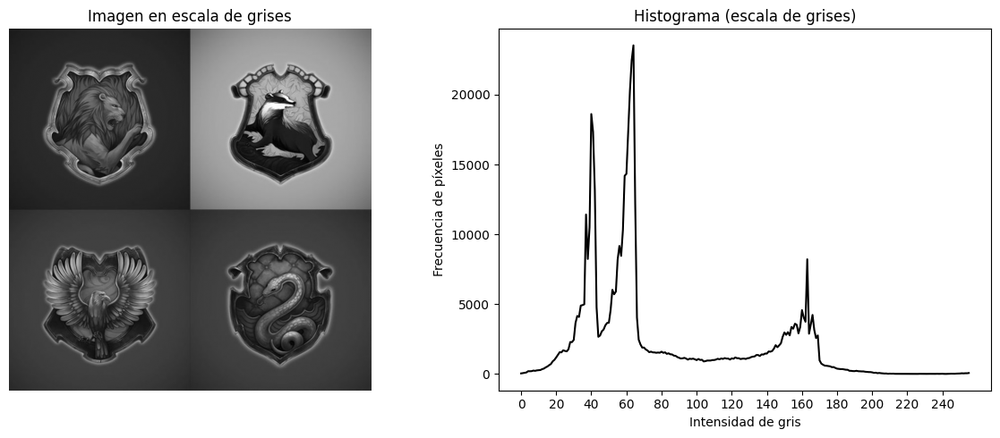

In [29]:
# Este código convierte una imagen RGB a escala de grises, calcula su distribución de los niveles de gris y finalmente muestra la imagen en gris junto a su histograma.

# Convertir a escala de grises
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

# Calcular el histograma
histograma = cv2.calcHist([img_gray], [0], None, [256], [0, 256])

# Mostrar la imagen en gris y su histograma
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

axs[0].imshow(img_gray, cmap='gray')
axs[0].set_title("Imagen en escala de grises")
axs[0].axis('off')

axs[1].plot(histograma, color='black')
axs[1].set_title("Histograma (escala de grises)")
axs[1].set_xlabel("Intensidad de gris")
axs[1].set_ylabel("Frecuencia de píxeles")
axs[1].set_xticks(np.arange(0, 256, 20))

plt.tight_layout()
plt.show()

En el histograma de escala de grises podemos ver los picos más altos en los valores cercanos a 0 (pixeles más oscuros). También se observa un pico más pequeño cercano al valor 160 (pixeles más claros).

Los picos cercanos a los pixeles más oscuros pueden ser ocasionados por los fondos rojo, azul y verde, ya que estos se vuelven tonos oscuros en escala de grises.

El pico más aislados probablemente corresponde al fondo amarillo, que en escala de grises se convierte en un tono más claro.

## Inciso C

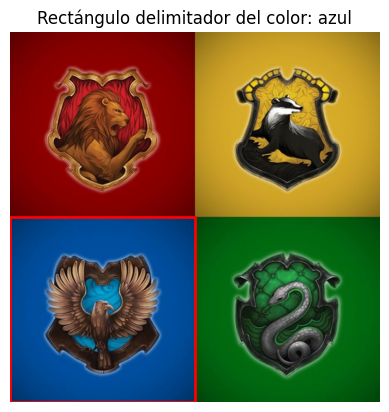

In [33]:
# Este código busca en una imagen binaria (blanco y negro) los píxeles blancos (valor > 0) y calcula un rectángulo que los encierra.
# Luego, dibuja ese rectángulo sobre la imagen original en color para delimitar la región donde se encuentra el color previamente segmentado

N, M = binaria.shape  # Alto y ancho de la imagen binaria

# Buscar las coordenadas del rectángulo
# Se inicializan variables para encontrar los límites de los píxeles blancos: se inicializan con valores extremos para que luego se vayan ajustando.
i_min = 500
i_max = 0
j_min = 500
j_max = 0

for i in range(N): #  Se recorre la imagen píxel por píxel
    for j in range(M):
        if binaria[i, j] > 0: # Se verifica si el píxel es blanco (> 0) en la imagen binaria
            if i < i_min: i_min = i # Se actualizan los límites del rectángulo:
            if i > i_max: i_max = i
            if j < j_min: j_min = j
            if j > j_max: j_max = j # Al final del recorrido, tendremos los bordes exactos del grupo de píxeles blancos

# Dibujar el rectángulo sobre la imagen original (RGB)
y = [i_min, i_min, i_max, i_max, i_min]
x = [j_min, j_max, j_max, j_min, j_min]

plt.imshow(img_rgb)
plt.plot(x, y, color='red', linewidth=2)
plt.title(f'Rectángulo delimitador del color: {color}')
plt.axis('off')
plt.show()

**La detección correcta funciona únicamente para la imagen azul. Para los otros escudos no vamos a obtener un rectangulo bien definido y claro. Esto puede deberse a que son colores "más mezclados", colores similares en intensidad (por ejemplo, un amarillo puede tener valores RGB similares a un rojo claro o el verde puede mezclarse con sombras o zonas que también tienen algo de rojo). Lo cual provocaría que la máscara binaria incluya muchas más zonas, a veces por todo el borde o en otras regiones de la imagen.**

Para solucionar este inconveniente se recurrió a una solución propuesta por ChatGPT. El código que se propone a continuación detecta objetos (zonas blancas) en una imagen binaria (0 = negro, 255 = blanco), encuentra el contorno más grande y dibuja un rectángulo ajustado (bounding box) sobre la imagen original a color. Además, muestra la imagen con ese rectángulo y las coordenadas del mismo.

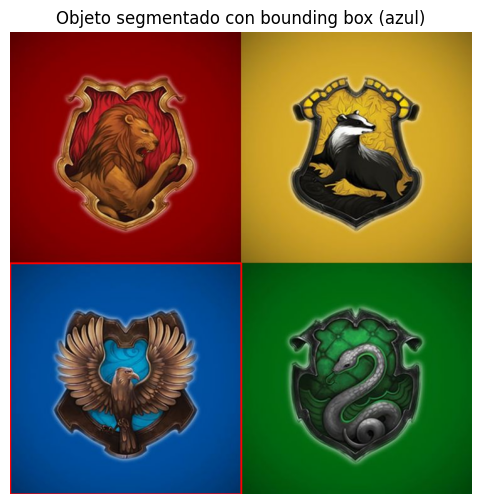

Coordenadas del rectángulo: (x=0, y=368, ancho=368, alto=368)


In [34]:
# Asegurarse de que la imagen binaria esté en formato uint8 (valores 0 o 255): necesario para usar funciones de OpenCV como cv2.findContours
binaria_uint8 = binaria.astype(np.uint8)

# Encontrar contornos de las regiones blancas
contornos, _ = cv2.findContours(binaria_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE) # Solo toma los contornos externos (descarta huecos internos). Simplifica el número de puntos del contorno.

# Si hay contornos, buscamos el más grande (por área)
if contornos: # Verifica si se encontró al menos un contorno.
    contorno_max = max(contornos, key=cv2.contourArea) # Elige el contorno más grande (por área). Es útil si hay pequeñas manchas o ruido.
    x, y, w, h = cv2.boundingRect(contorno_max) # Obtiene las coordenadas del rectángulo mínimo que encierra el contorno más grande

    # Dibujar el rectángulo sobre la imagen original
    img_con_rect = img_rgb.copy()
    cv2.rectangle(img_con_rect, (x, y), (x + w, y + h), (255, 0, 0), 2)

    # Mostrar resultados
    plt.figure(figsize=(6, 6))
    plt.imshow(img_con_rect)
    plt.title(f"Objeto segmentado con bounding box ({color})")
    plt.axis('off')
    plt.show()

    # Mostrar coordenadas
    print(f"Coordenadas del rectángulo: (x={x}, y={y}, ancho={w}, alto={h})")
else:
    print("No se encontraron objetos segmentados.")


## Inciso D

Este código realiza detección de bordes simple sobre una imagen binaria (blanco y negro), y luego resalta esos bordes en rojo sobre la imagen original.

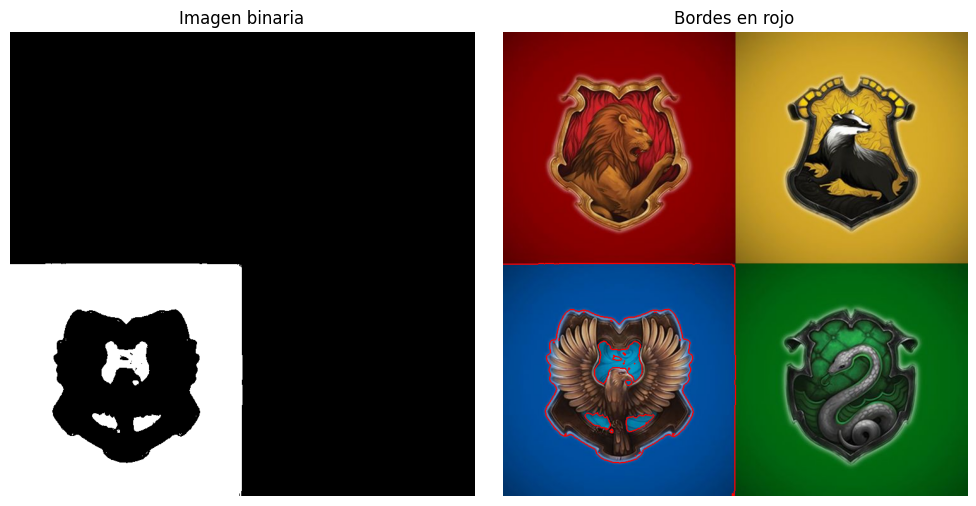

In [35]:
# Dimensiones: Se obtiene el alto (N) y ancho (M) de la imagen binaria (en blanco y negro).
N, M = binaria.shape

# Detección de bordes: Crea una imagen del mismo tamaño que binaria, llena de ceros (0 = negro).
borde = np.zeros((N, M), np.uint8) # Esta imagen almacenará los bordes detectados.

# Detectar bordes horizontales
for i in range(N): # Recorre cada fila de la imagen binaria.
    for j in range(1, M): # Recorre cada columna, empezando desde la columna 1
        if binaria[i, j] != binaria[i, j - 1]: # Compara el valor del píxel actual, con su vecino de la izquierda. Si son diferentes quiere decir que hay un cambio de color
            borde[i, j] = 1 # Se marcan ambos píxeles (el actual y el de la izquierda) como borde, asignándoles el valor 1 en la matriz borde.
            borde[i, j - 1] = 1 # El cambio ocurre entre ellos, no en uno solo, y así el borde queda más visible y robusto.

# Bordes verticales
for i in range(1, N):
    for j in range(M):
        if binaria[i, j] != binaria[i - 1, j]:
            borde[i, j] = 1
            borde[i - 1, j] = 1

# Dibujar bordes en rojo sobre imagen original
img_con_bordes = img_cv.copy() # Hace una copia de la imagen original para no modificar la original.
for i in range(N):
    for j in range(M):
        if borde[i, j] == 1: # Si hay un borde (= 1), lo pinta rojo puro ((0, 0, 255) en BGR) sobre la imagen.
            img_con_bordes[i, j] = [0, 0, 255]  # Rojo (BGR)

# Mostrar lado a lado: binaria y con bordes
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(binaria, cmap='gray')
axs[0].set_title("Imagen binaria")
axs[0].axis('off')

axs[1].imshow(img_con_bordes[:, :, [2, 1, 0]])  # BGR → RGB
axs[1].set_title("Bordes en rojo")
axs[1].axis('off')

plt.tight_layout()
plt.show()